In [1]:
import numpy as np
import matplotlib.pyplot as plt

import rand
from utils import font_setting, vec2equatorial

# %matplotlib notebook
font_setting()

# uniform_spherical_vector

In [2]:
uni = rand.uniform_spherical_vector(n=50000, seed=100)
alpha, delta = vec2equatorial(uni)

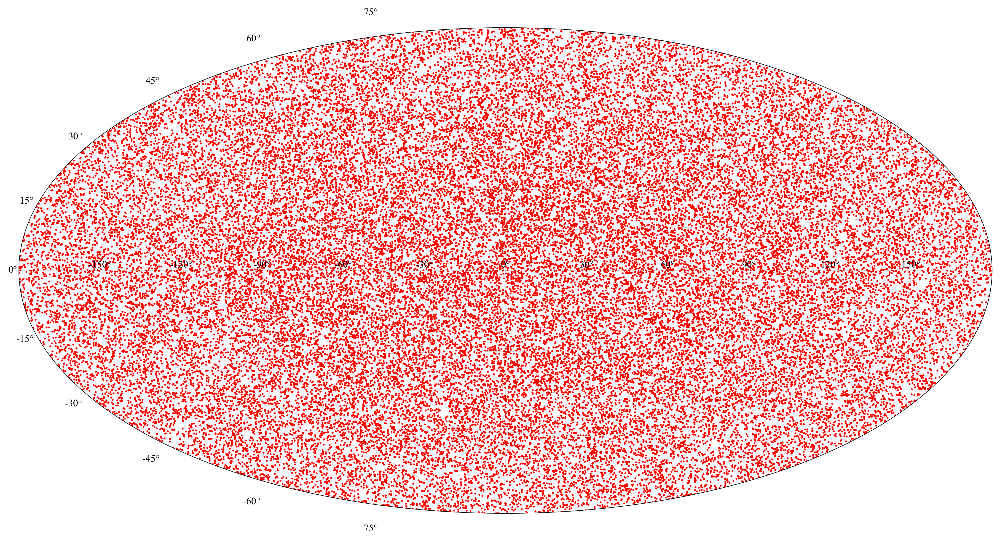

In [3]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="aitoff")
ax.scatter(
    alpha, delta,
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()

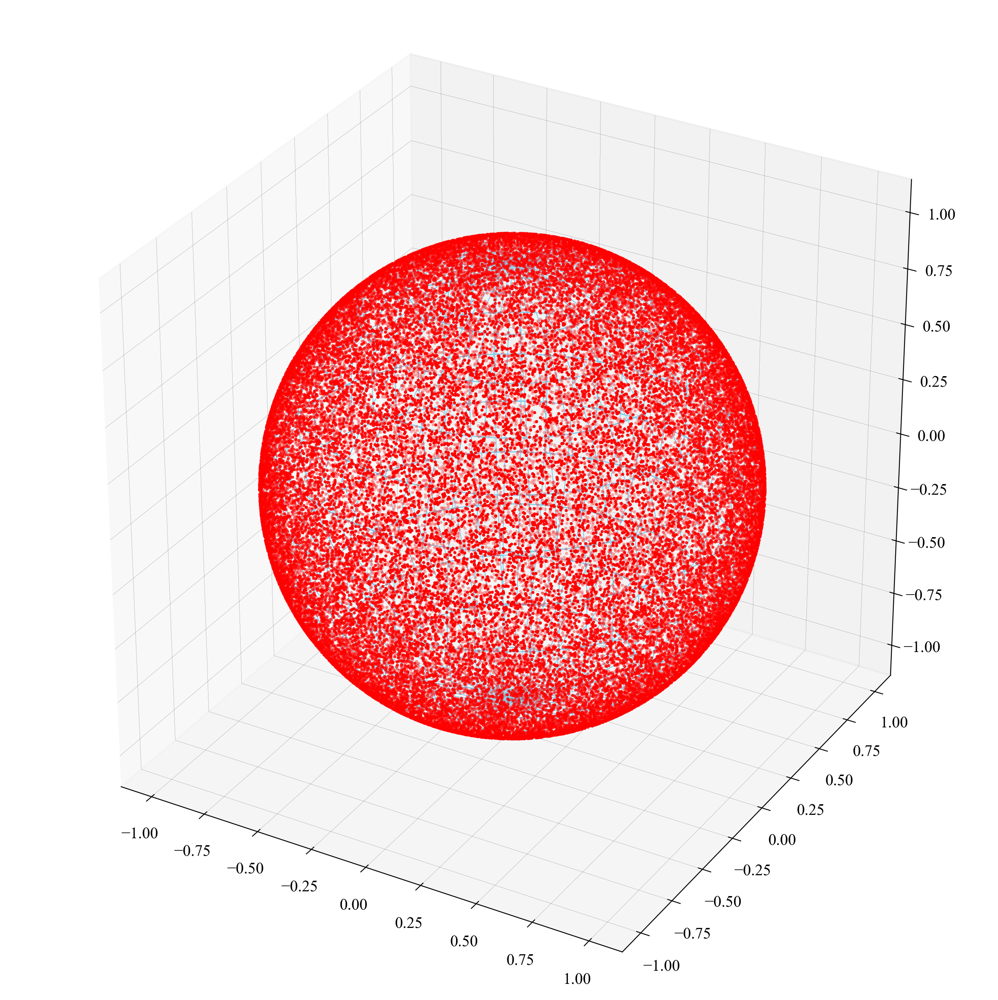

In [4]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="3d")
ax.set_box_aspect((1,1,1))
# 
theta1,theta2 = np.mgrid[0:2*np.pi:30j,0:2*np.pi:30j]
ax.plot_wireframe(
    np.cos(theta1)*np.sin(theta2), 
    np.sin(theta1)*np.sin(theta2), 
    np.cos(theta2),
    color="skyblue", linewidth=0.5)
# 
ax.scatter(
    uni[:, 0], uni[:, 1], uni[:, 2], 
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()

# uniform_limited_spherical_vector

In [5]:
mu = np.array([1, 0, 0])
theta_max = 30*np.pi/180

uni_lim = rand.uniform_limited_spherical_vector(theta_max, mu, n=4000, seed=100)
alpha_lim, delta_lim = vec2equatorial(uni_lim)

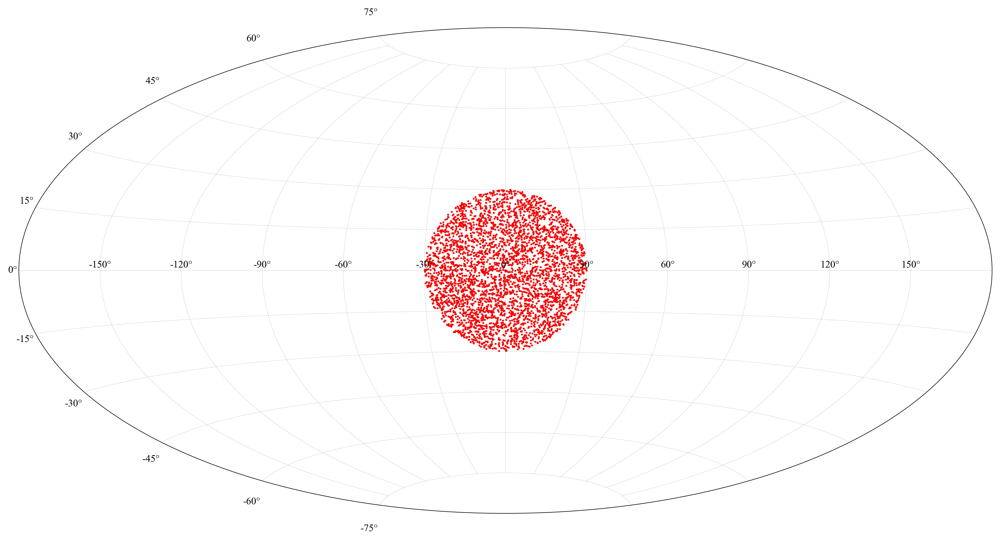

In [6]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="aitoff")
ax.scatter(
    alpha_lim, delta_lim,
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()

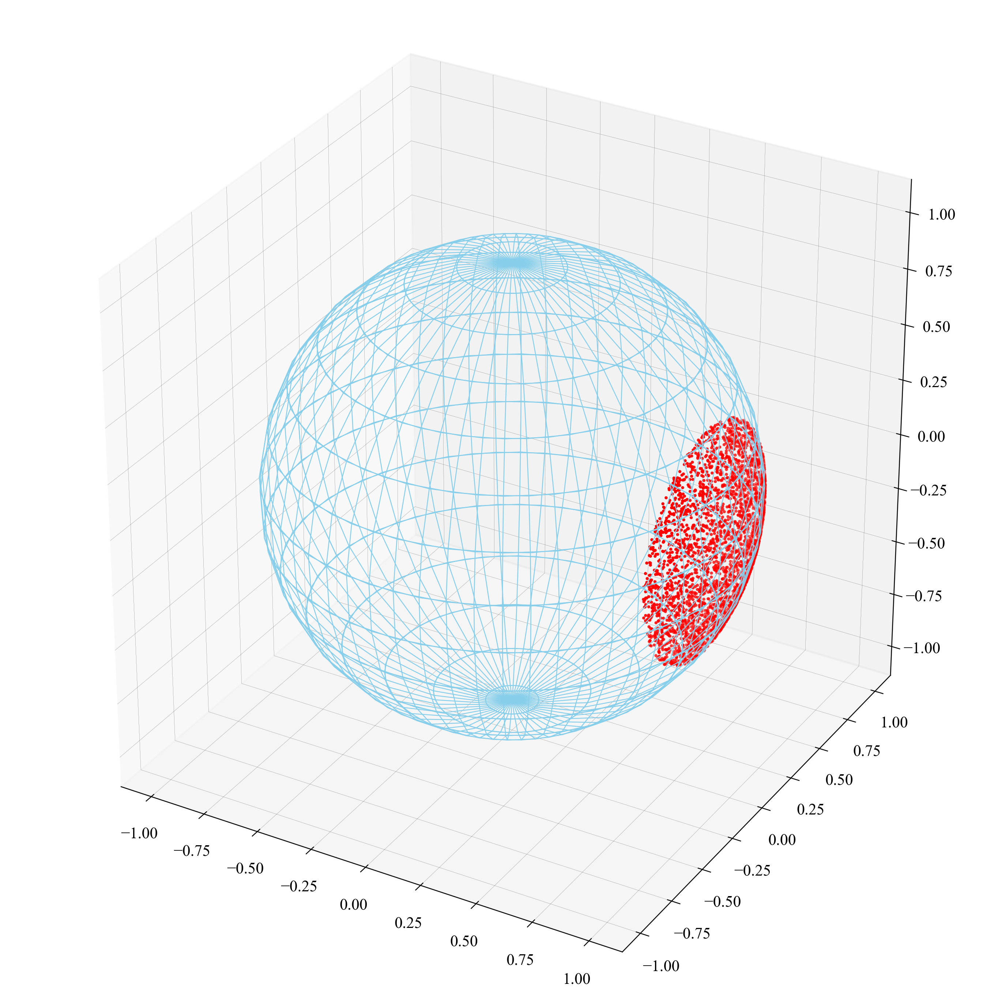

In [7]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="3d")
ax.set_box_aspect((1,1,1))
# 
theta1,theta2 = np.mgrid[0:2*np.pi:30j,0:2*np.pi:30j]
ax.plot_wireframe(
    np.cos(theta1)*np.sin(theta2), 
    np.sin(theta1)*np.sin(theta2), 
    np.cos(theta2),
    color="skyblue", linewidth=0.5)
# 
ax.scatter(
    uni_lim[:, 0], uni_lim[:, 1], uni_lim[:, 2], 
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()

# von_mises_fisher_3d_sampling

In [8]:
mu = np.array([1, 0, 0])
kappa99 = rand.estimate_kappa_von_mises_fisher_3d(30*np.pi/180, 0.99)

uni_von99 = rand.von_mises_fisher_3d_sampling(mu, kappa99, n=1000, seed=100)
alpha_von99, delta_von99 = vec2equatorial(uni_von99)

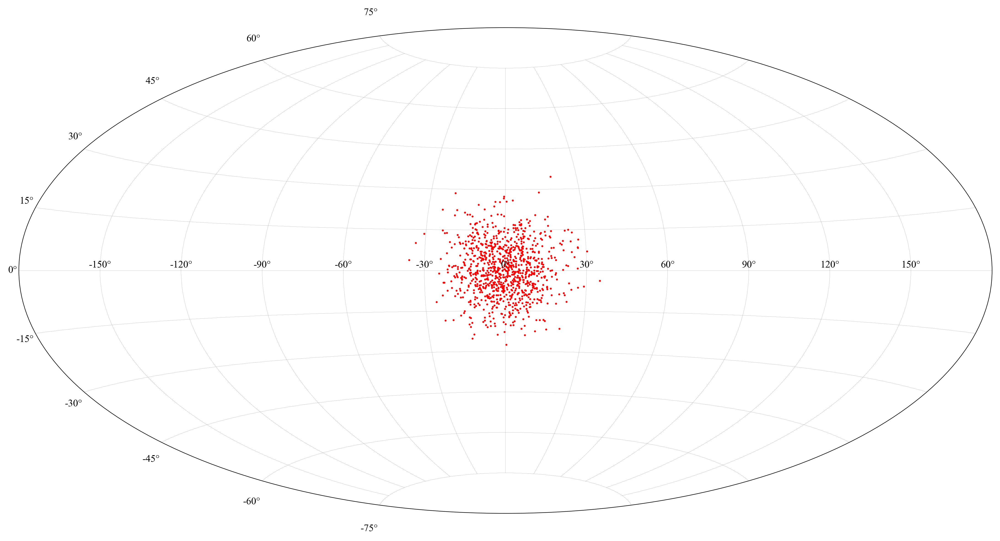

In [9]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="aitoff")
ax.scatter(
    alpha_von99, delta_von99,
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()

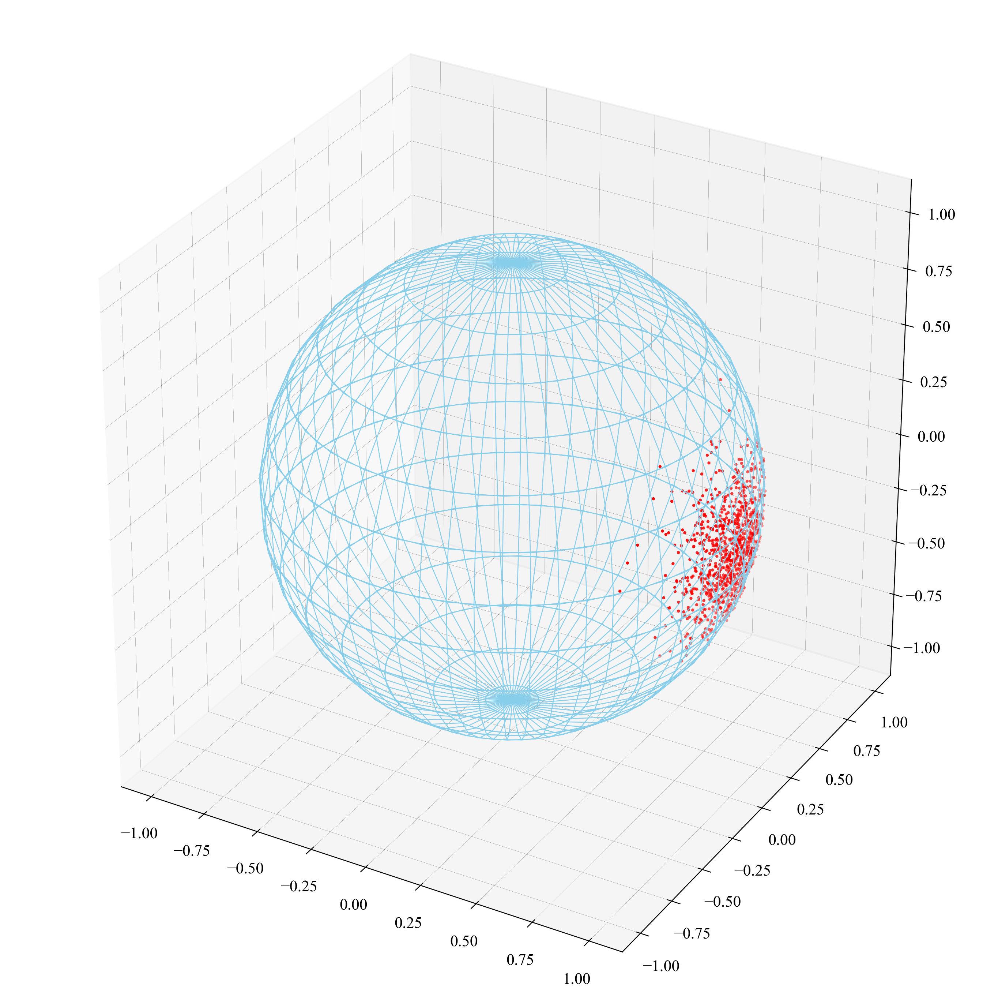

In [10]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="3d")
ax.set_box_aspect((1,1,1))
# 
theta1,theta2 = np.mgrid[0:2*np.pi:30j,0:2*np.pi:30j]
ax.plot_wireframe(
    np.cos(theta1)*np.sin(theta2), 
    np.sin(theta1)*np.sin(theta2), 
    np.cos(theta2),
    color="skyblue", linewidth=0.5)
# 
ax.scatter(
    uni_von99[:, 0], uni_von99[:, 1], uni_von99[:, 2], 
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()

# weight

In [11]:
mu = np.array([1, 0, 0])
theta = 1*np.pi/180

# alpha_k = 0.9545
# alpha_k_sampling = 0.9973
alpha_k = 0.99
alpha_k_sampling = 0.999999
kappa = rand.estimate_kappa_von_mises_fisher_3d(theta, alpha_k)
theta_sampling = rand.estimate_thata_von_mises_fisher_3d(
    kappa, alpha_k_sampling)

uni_von = rand.von_mises_fisher_3d_sampling(mu, kappa, n=10000, seed=100)
alpha_von, delta_von = vec2equatorial(uni_von)

uni_sam = rand.uniform_limited_spherical_vector(theta_sampling, mu, n=10000, seed=100)
alpha_sam, delta_sam = vec2equatorial(uni_sam)

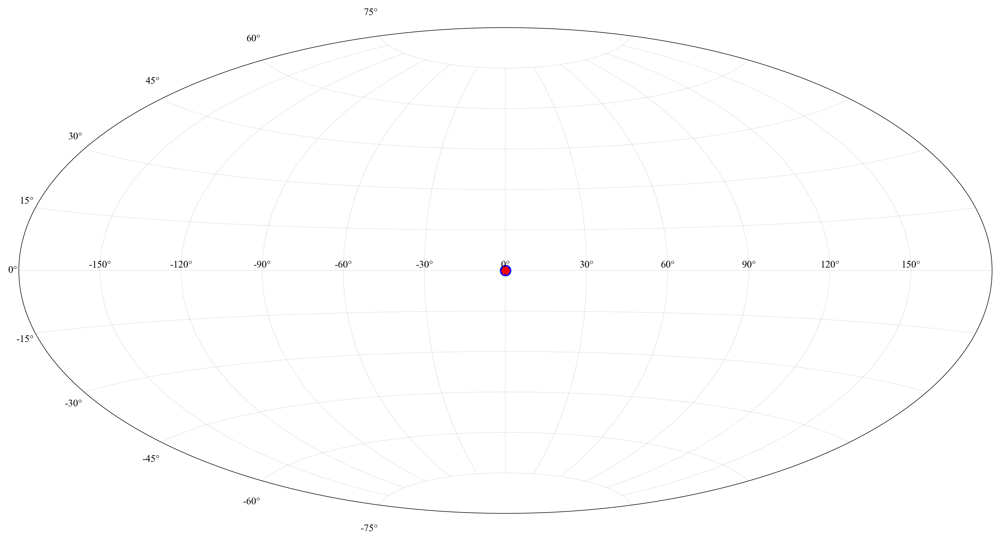

In [12]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="aitoff")
ax.scatter(
    alpha_sam, delta_sam,
    s=3, linewidths=1.0e-10,
    marker='o', color='blue'
)
ax.scatter(
    alpha_von, delta_von,
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()

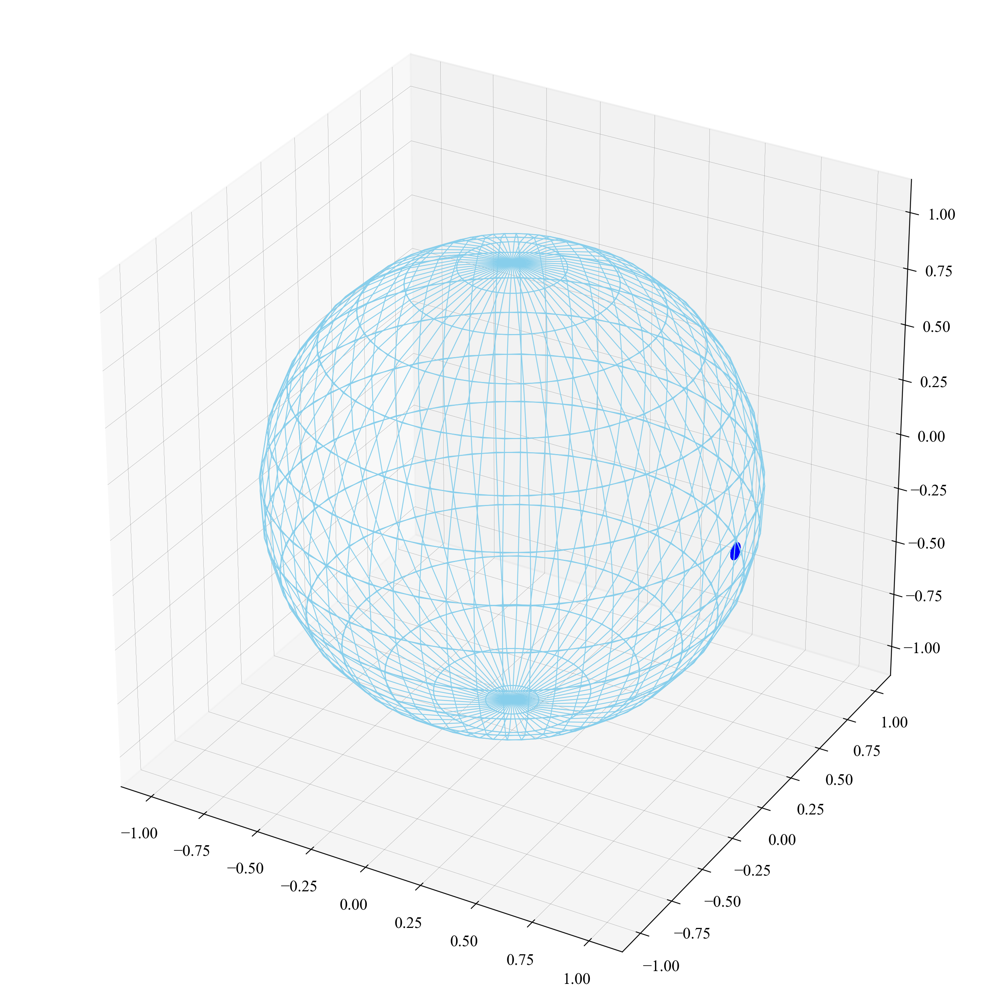

In [13]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="3d")
ax.set_box_aspect((1,1,1))
# 
theta1,theta2 = np.mgrid[0:2*np.pi:30j,0:2*np.pi:30j]
ax.plot_wireframe(
    np.cos(theta1)*np.sin(theta2), 
    np.sin(theta1)*np.sin(theta2), 
    np.cos(theta2),
    color="skyblue", linewidth=0.5)
# 
ax.scatter(
    uni_sam[:, 0], uni_sam[:, 1], uni_sam[:, 2], 
    s=3, linewidths=1.0e-10,
    marker='o', color='blue'
)
ax.scatter(
    uni_von[:, 0], uni_von[:, 1], uni_von[:, 2], 
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()

mean

In [14]:
def von(theta, kappa):
    numerator = kappa * np.exp(kappa*(np.cos(theta)-1)) * np.sin(theta)
    denominator = 1 - np.exp(-2*kappa)
    return numerator/denominator

def uni(theta, Theta):
    numerator = np.sin(theta)
    denominator = 2 * np.pi * (1 - np.cos(Theta))
    # 
    numerator[theta > Theta] = 0
    return numerator/denominator

def calc_weight(theta, kappa, Theta):
    numerator = kappa * np.exp(kappa*(np.cos(theta)-1)) * (1 - np.cos(Theta))
    denominator = 1 - np.exp(-2*kappa)
    return numerator/denominator

In [15]:
uni_sam, theta_rand = rand.uniform_limited_spherical_vector(theta_sampling, mu, n=1000, seed=100, theta_flag=True)
uni_sam2, theta_rand2 = rand.uniform_limited_spherical_vector(theta_sampling, mu, n=1000, seed=200, theta_flag=True)

In [16]:
(calc_weight(theta_rand, kappa, theta_sampling)*calc_weight(theta_rand2, kappa, theta_sampling)).mean()


0.9995592389945566

# weight 2

In [17]:
mu = np.array([1, 0, 0])
theta = 30*np.pi/180

alpha_k = 0.9973
alpha_k_sampling = 0.9545
kappa99 = rand.estimate_kappa_von_mises_fisher_3d(theta, alpha_k)
kappa50 = rand.estimate_kappa_von_mises_fisher_3d(theta, alpha_k_sampling)

uni_von = rand.von_mises_fisher_3d_sampling(mu, kappa99, n=10000, seed=100)
alpha_von, delta_von = vec2equatorial(uni_von)

uni_sam = rand.von_mises_fisher_3d_sampling(mu, kappa50, n=10000, seed=100)
alpha_sam, delta_sam = vec2equatorial(uni_sam)

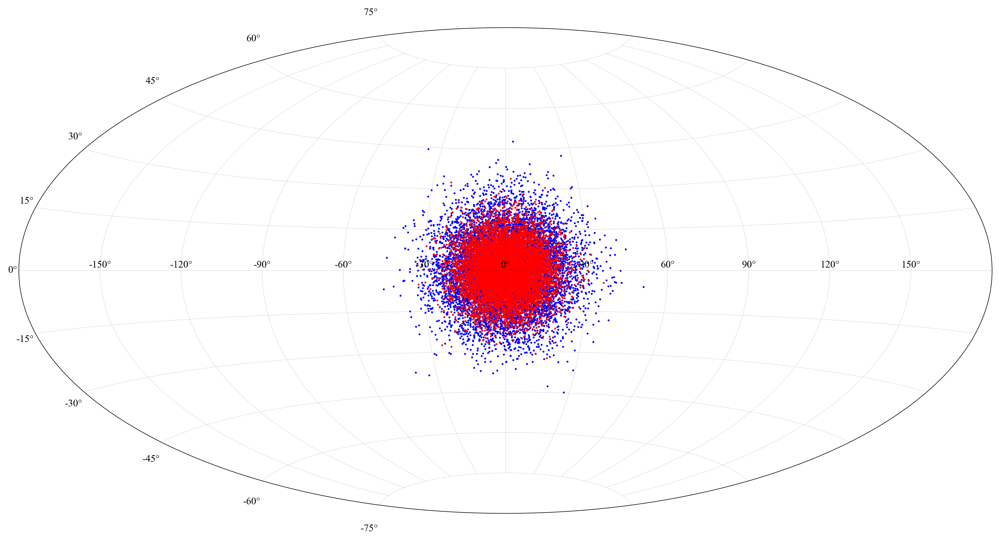

In [18]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="aitoff")
ax.scatter(
    alpha_sam, delta_sam,
    s=3, linewidths=1.0e-10,
    marker='o', color='blue'
)
ax.scatter(
    alpha_von, delta_von,
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()

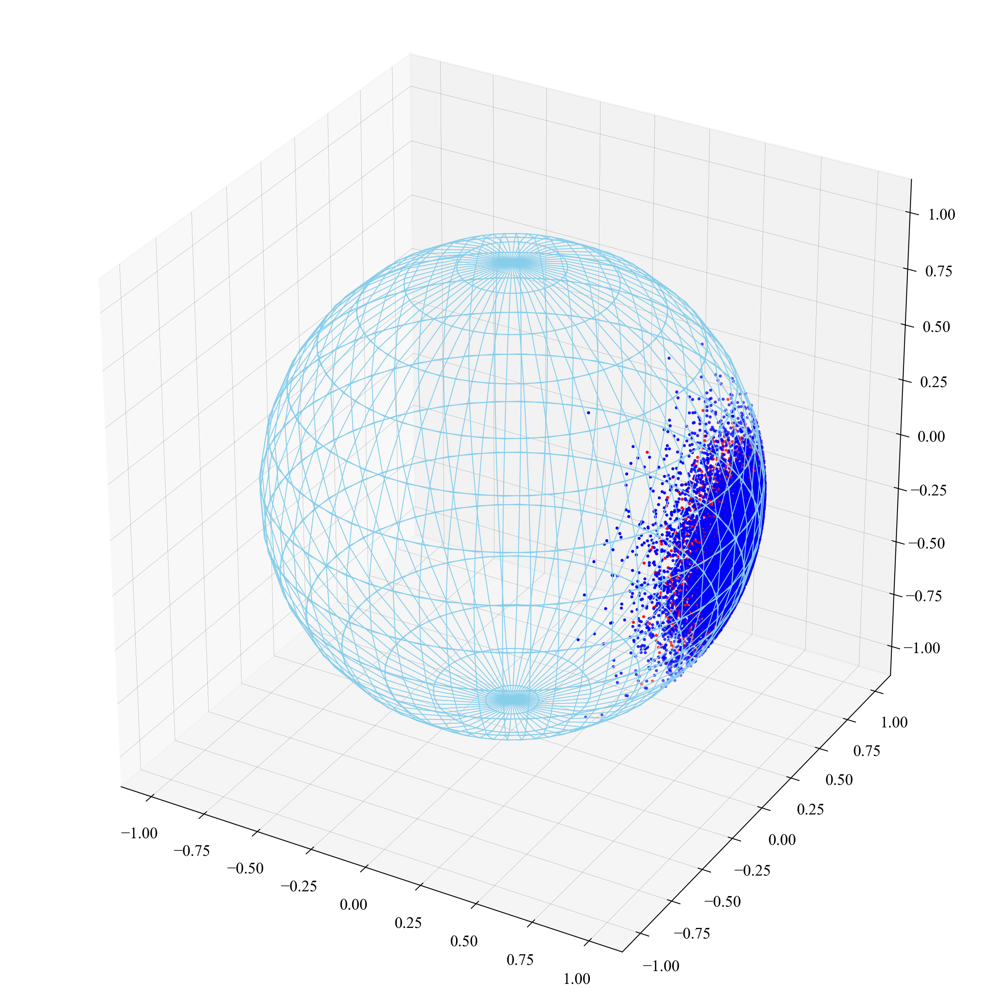

In [19]:
scale = 10
fig = plt.figure(figsize=(scale*1.6, scale))
ax = fig.add_subplot(111, projection="3d")
ax.set_box_aspect((1,1,1))
# 
theta1,theta2 = np.mgrid[0:2*np.pi:30j,0:2*np.pi:30j]
ax.plot_wireframe(
    np.cos(theta1)*np.sin(theta2), 
    np.sin(theta1)*np.sin(theta2), 
    np.cos(theta2),
    color="skyblue", linewidth=0.5)
# 
ax.scatter(
    uni_sam[:, 0], uni_sam[:, 1], uni_sam[:, 2], 
    s=3, linewidths=1.0e-10,
    marker='o', color='blue'
)
ax.scatter(
    uni_von[:, 0], uni_von[:, 1], uni_von[:, 2], 
    s=3, linewidths=1.0e-10,
    marker='o', color='red'
)

plt.show()